- MapMycell annotation for AP18a_MERFISH, donor-ID:3924

In [1]:
import anndata
import h5py
import json
import numpy as np
import pandas as pd
import pathlib
import scanpy as sc

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '3'

#### 1. Load the expression matrix

In [2]:
# load the raw data

fl_path = r'./processed_data/MER5_CaPuNAc_3924__MERFISH_Ldclustered_adata.h5ad'
print(f'Running analysis for  {os.path.basename(fl_path)}')
adata = anndata.read_h5ad(fl_path)
adata

Running analysis for  MER5_CaPuNAc_3924__MERFISH_Ldclustered_adata.h5ad


AnnData object with n_obs × n_vars = 507450 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'umap'
    obsm: 'X_raw', 'X_spatial', 'X_umap'
    layers: 'X_raw'
    obsp: 'connectivities', 'distances'

In [ ]:
# get the Ensemble ID for the MERFISH genes 
import pandas as pd
codebook = pd.read_csv(r'./../../processed_data/Final_codebook_BG_673gn.csv',index_col=0)
genes = [gn for gn in codebook.index if 'blank' not in gn.lower()]
gene2EnsembleID = codebook.loc[genes,'id'].to_dict()

adata.var['Ensemble_ID'] = '-1'
adata.var.loc[adata.var_names,'Ensemble_ID'] = codebook.loc[adata.var_names,'id']
adata.var

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,Ensemble_ID
ABCA8,51299,0.181896,0.167120,90.131600,94555,11.456948,ENSG00000141338
ABCG2,10557,0.032928,0.032397,97.969148,17117,9.747886,ENSG00000118777
ABI3BP,62355,0.481670,0.393170,88.004755,250387,12.430767,ENSG00000154175
ABO,38324,0.151207,0.140811,92.627604,78602,11.272165,ENSG00000175164
ACOXL,8414,0.025706,0.025382,98.381397,13363,9.500320,ENSG00000153093
...,...,...,...,...,...,...,...
YME1L1,28360,0.141634,0.132461,94.544381,73626,11.206767,ENSG00000136758
YPEL1,152593,2.298258,1.193395,70.645652,1194706,13.993412,ENSG00000100027
ZBTB7C,30273,0.144116,0.134632,94.176377,74916,11.224136,ENSG00000184828
ZEB2,344050,7.212800,2.105694,33.815028,3749437,15.137117,ENSG00000169554


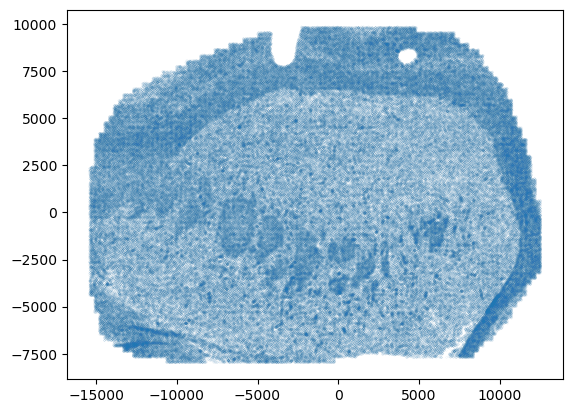

In [5]:
import matplotlib.pyplot as plt
plt.scatter(adata.obsm['X_spatial'][:,1],adata.obsm['X_spatial'][:,0], s = 0.001)
# plt.gca().invert_yaxis()
plt.show()

- Save the input expression matrix for mapmycell

In [5]:
adata

AnnData object with n_obs × n_vars = 1124161 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'Ensemble_ID'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_raw', 'X_spatial', 'X_umap'
    layers: 'X_raw'
    obsp: 'connectivities', 'distances'

In [ ]:
# This is for single cell mapping 
# # save the expresssion matrix 
mapmycell_input = anndata.AnnData(adata.layers['X_raw'])
# remove the blank genes 
keep = [x != '-1' for x in adata.var['Ensemble_ID']]
mapmycell_input= mapmycell_input[:,keep]

mapmycell_input.var = adata[:,keep].var.set_index('Ensemble_ID')
mapmycell_input.obs_names = adata.obs_names




In [7]:
mapmycell_input

AnnData object with n_obs × n_vars = 507450 × 673
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [8]:
del mapmycell_input.var['log1p_total_counts']
del mapmycell_input.var['total_counts']
del mapmycell_input.var['pct_dropout_by_counts']
del mapmycell_input.var['log1p_mean_counts']
del mapmycell_input.var['mean_counts']
del mapmycell_input.var['n_cells_by_counts']

In [9]:
mapmycell_input.var

""
Ensemble_ID
ENSG00000141338
ENSG00000118777
ENSG00000154175
ENSG00000175164
ENSG00000153093
...
ENSG00000136758
ENSG00000100027
ENSG00000184828


In [10]:
os.makedirs(r'./processed_data', exist_ok=True)
mapmycell_input.write_h5ad(r'./processed_data/mapmycell_input_' + f'{os.path.basename(fl_path)}',compression = 'gzip')

#### 2. Map the unlabled_dataset to Allen snRNA-seq data

In [11]:
import sys
sys.path.append('/data/Bereket/cell_type_mapper/src')
from cell_type_mapper.cli.from_specified_markers import ( FromSpecifiedMarkersRunner)


In [ ]:
config = {
    'precomputed_stats': {
        'path': r'./../../HumanBG_scRNA_seq_Allen/Human.precomputed_stats.20250507.h5'
    },
    'query_markers': {
        'serialized_lookup': r'./../../HumanBG_scRNA_seq_Allen/Human.query_markers.20250507.json'
    },
    'type_assignment': {
        'bootstrap_factor': 0.5,
        'bootstrap_iteration': 100,
        'rng_seed': 661123,
        'n_processors': 1,
        'normalization': 'raw'
    },
    'query_path': r'./processed_data/mapmycell_input_' + f'{os.path.basename(fl_path)}',
    'extended_result_path': r'./processed_data/mapmycell_result_' + f'{os.path.basename(fl_path).split(".h5ad")[0]}.json',
    'csv_result_path': r'./processed_data/mapmycell_result_' + f'{os.path.basename(fl_path).split(".h5ad")[0]}.csv'
}

mapping_runner = FromSpecifiedMarkersRunner(
    args=[], input_data=config)

mapping_runner.run()

=== Running Hierarchical Mapping 1.5.1 with config ===
{
  "map_to_ensembl": false,
  "verbose_stdout": true,
  "nodes_to_drop": null,
  "type_assignment": {
    "n_processors": 1,
    "bootstrap_iteration": 100,
    "bootstrap_factor": 0.5,
    "bootstrap_factor_lookup": null,
    "chunk_size": 10000,
    "normalization": "raw",
    "rng_seed": 661123,
    "n_runners_up": 5,
    "min_markers": 10,
    "log_level": "ERROR"
  },
  "extended_result_path": "./processed_data/mapmycell_result_MER5_CaPuNAc_3924__MERFISH_Ldclustered_adata.json",
  "hdf5_result_path": null,
  "csv_result_path": "./processed_data/mapmycell_result_MER5_CaPuNAc_3924__MERFISH_Ldclustered_adata.csv",
  "summary_metadata_path": null,
  "obsm_key": null,
  "obsm_clobber": false,
  "verbose_csv": false,
  "query_path": "./processed_data/mapmycell_input_MER5_CaPuNAc_3924__MERFISH_Ldclustered_adata.h5ad",
  "drop_level": null,
  "tmp_dir": null,
  "extended_result_dir": null,
  "flatten": false,
  "max_gb": 100.0,
  "cl

/data/Bereket/cell_type_mapper/src/cell_type_mapper/taxonomy/utils.py:253: UserWarning: This taxonomy has no mapping from leaf_node -> rows in the cell by gene matrix
  warnings.warn("This taxonomy has no mapping from leaf_node -> rows "
/data/Bereket/cell_type_mapper/src/cell_type_mapper/cli/cli_log.py:73: UserWarning: parent node 'CCN20250428_LEVEL_3/CS20250428_GROUP_0059' had too few markers in query set; augmenting with markers from ['CCN20250428_LEVEL_2/CS20250428_SUBCL_0015']
  warnings.warn(msg)
/data/Bereket/cell_type_mapper/src/cell_type_mapper/cli/cli_log.py:73: UserWarning: parent node 'CCN20250428_LEVEL_3/CS20250428_GROUP_0048' had too few markers in query set; augmenting with markers from ['CCN20250428_LEVEL_2/CS20250428_SUBCL_0001']
  warnings.warn(msg)
/data/Bereket/cell_type_mapper/src/cell_type_mapper/cli/cli_log.py:73: UserWarning: parent node 'CCN20250428_LEVEL_3/CS20250428_GROUP_0045' had too few markers in query set; augmenting with markers from ['CCN20250428_LEVEL

BENCHMARK: spent 1.0685e-01 seconds creating query marker cache
Running GPU implementation of type assignment.
Assignment: [ 1/51]  Time [ 8.408 ( 8.408)  8.408]   Data [ 2.333 ( 2.333)  2.333] 
Assignment: [ 2/51]  Time [ 5.820 ( 7.114) 14.227]   Data [ 0.003 ( 1.168)  2.337] 
Assignment: [ 3/51]  Time [ 5.590 ( 6.606) 19.818]   Data [ 0.001 ( 0.779)  2.338] 
Assignment: [ 4/51]  Time [ 5.959 ( 6.444) 25.776]   Data [ 0.001 ( 0.585)  2.339] 
Assignment: [ 5/51]  Time [ 5.727 ( 6.301) 31.503]   Data [ 0.001 ( 0.468)  2.340] 
Assignment: [ 6/51]  Time [ 5.353 ( 6.143) 36.856]   Data [ 0.001 ( 0.390)  2.341] 
Assignment: [ 7/51]  Time [ 5.803 ( 6.094) 42.659]   Data [ 0.001 ( 0.335)  2.342] 
Assignment: [ 8/51]  Time [ 5.649 ( 6.039) 48.309]   Data [ 0.001 ( 0.293)  2.344] 
Assignment: [ 9/51]  Time [ 5.852 ( 6.018) 54.160]   Data [ 0.001 ( 0.261)  2.345] 
Assignment: [10/51]  Time [ 5.580 ( 5.974) 59.740]   Data [ 0.001 ( 0.235)  2.346] 
Assignment: [11/51]  Time [ 5.250 ( 5.908) 64.990

[W827 17:04:07.104928410 CudaIPCTypes.cpp:16] Producer process has been terminated before all shared CUDA tensors released. See Note [Sharing CUDA tensors]


BENCHMARK: spent 3.1460e+02 seconds assigning cell types
Writing marker genes to output file
MAPPING FROM SPECIFIED MARKERS RAN SUCCESSFULLY
CLEANING UP


#### 3. Check the mapping results

In [13]:
# check the mapping results.
import pandas as pd

cell_type_annotation = pd.read_csv(r'./processed_data/mapmycell_result_' + f'{os.path.basename(fl_path).split(".h5ad")[0]}.csv', header = 4)
cell_type_annotation['cell_id'] = cell_type_annotation['cell_id'].astype(str).astype('O')
cell_type_annotation = cell_type_annotation.set_index('cell_id')
cell_type_annotation

,Neighborhood_label,Neighborhood_name,Neighborhood_bootstrapping_probability,Class_label,Class_name,Class_bootstrapping_probability,Subclass_label,Subclass_name,Subclass_bootstrapping_probability,Group_label,Group_name,Group_bootstrapping_probability,Cluster_label,Cluster_name,Cluster_alias,Cluster_bootstrapping_probability
cell_id,,,,,,,,,,,,,,,,
Conv_zscan__1864--1,CS20250428_NEIGH_0001,Nonneuron,0.86,CS20250428_CLASS_0008,Immune,0.56,CS20250428_SUBCL_0019,Microglia,0.38,CS20250428_GROUP_0019,Microglia,1.00,CS20250428_CLUST_0209,Human-5,Human-5,0.28
Conv_zscan__1864--2,CS20250428_NEIGH_0001,Nonneuron,0.99,CS20250428_CLASS_0010,OPC-Oligo,0.41,CS20250428_SUBCL_0022,Oligodendrocyte,0.56,CS20250428_GROUP_0018,ImOligo,1.00,CS20250428_CLUST_0201,Human-47,Human-47,0.63
Conv_zscan__1864--4,CS20250428_NEIGH_0001,Nonneuron,1.00,CS20250428_CLASS_0000,Astro-Epen,1.00,CS20250428_SUBCL_0000,Astrocyte,1.00,CS20250428_GROUP_0039,Astrocyte,0.79,CS20250428_CLUST_0255,Human-232,Human-232,0.57
Conv_zscan__1864--5,CS20250428_NEIGH_0002,Subpallium GABA,0.91,CS20250428_CLASS_0006,F M GABA,0.47,CS20250428_SUBCL_0005,CN LHX8 GABA,0.74,CS20250428_GROUP_0020,GPe-NDB-SI LHX6-LHX8-GBX1 GABA,0.67,CS20250428_CLUST_0331,Human-251,Human-251,0.76
Conv_zscan__1864--6,CS20250428_NEIGH_0001,Nonneuron,0.91,CS20250428_CLASS_0008,Immune,0.55,CS20250428_SUBCL_0019,Microglia,0.74,CS20250428_GROUP_0019,Microglia,1.00,CS20250428_CLUST_0209,Human-5,Human-5,0.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Conv_zscan__4180--159,CS20250428_NEIGH_0002,Subpallium GABA,0.96,CS20250428_CLASS_0003,CN LGE GABA,0.99,CS20250428_SUBCL_0028,STR D1 MSN,0.61,CS20250428_GROUP_0049,STRd D1 Matrix MSN,0.60,CS20250428_CLUST_0438,Human-30,Human-30,0.62
Conv_zscan__4180--181,CS20250428_NEIGH_0002,Subpallium GABA,0.56,CS20250428_CLASS_0005,CN MGE GABA,0.71,CS20250428_SUBCL_0033,STR SST-CHODL GABA,0.92,CS20250428_GROUP_0043,STR SST-CHODL GABA,1.00,CS20250428_CLUST_0395,Human-58,Human-58,0.71
Conv_zscan__4180--186,CS20250428_NEIGH_0001,Nonneuron,1.00,CS20250428_CLASS_0010,OPC-Oligo,0.86,CS20250428_SUBCL_0022,Oligodendrocyte,0.99,CS20250428_GROUP_0018,ImOligo,1.00,CS20250428_CLUST_0202,Human-49,Human-49,0.66


In [14]:
import anndata
mapmycell_input = anndata.read_h5ad(r'./processed_data/mapmycell_input_' + f'{os.path.basename(fl_path)}')

In [15]:
cell_type_annotation.index

Index(['Conv_zscan__1864--1', 'Conv_zscan__1864--2', 'Conv_zscan__1864--4',
       'Conv_zscan__1864--5', 'Conv_zscan__1864--6', 'Conv_zscan__1864--8',
       'Conv_zscan__1864--9', 'Conv_zscan__1864--10', 'Conv_zscan__1864--11',
       'Conv_zscan__1864--12',
       ...
       'Conv_zscan__4180--135', 'Conv_zscan__4180--143',
       'Conv_zscan__4180--144', 'Conv_zscan__4180--149',
       'Conv_zscan__4180--157', 'Conv_zscan__4180--159',
       'Conv_zscan__4180--181', 'Conv_zscan__4180--186',
       'Conv_zscan__4180--199', 'Conv_zscan__4180--219'],
      dtype='object', name='cell_id', length=507450)

In [16]:
mapmycell_input.obs = mapmycell_input.obs.join(cell_type_annotation[['Class_label','Class_name','Class_bootstrapping_probability','Subclass_label','Subclass_name','Subclass_bootstrapping_probability','Group_label','Group_name','Group_bootstrapping_probability']])

In [17]:
cell_type_annotation[['Class_label','Class_name','Class_bootstrapping_probability','Subclass_label','Subclass_name','Subclass_bootstrapping_probability','Group_label','Group_name','Group_bootstrapping_probability']]

,Class_label,Class_name,Class_bootstrapping_probability,Subclass_label,Subclass_name,Subclass_bootstrapping_probability,Group_label,Group_name,Group_bootstrapping_probability
cell_id,,,,,,,,,
Conv_zscan__1864--1,CS20250428_CLASS_0008,Immune,0.56,CS20250428_SUBCL_0019,Microglia,0.38,CS20250428_GROUP_0019,Microglia,1.00
Conv_zscan__1864--2,CS20250428_CLASS_0010,OPC-Oligo,0.41,CS20250428_SUBCL_0022,Oligodendrocyte,0.56,CS20250428_GROUP_0018,ImOligo,1.00
Conv_zscan__1864--4,CS20250428_CLASS_0000,Astro-Epen,1.00,CS20250428_SUBCL_0000,Astrocyte,1.00,CS20250428_GROUP_0039,Astrocyte,0.79
Conv_zscan__1864--5,CS20250428_CLASS_0006,F M GABA,0.47,CS20250428_SUBCL_0005,CN LHX8 GABA,0.74,CS20250428_GROUP_0020,GPe-NDB-SI LHX6-LHX8-GBX1 GABA,0.67
Conv_zscan__1864--6,CS20250428_CLASS_0008,Immune,0.55,CS20250428_SUBCL_0019,Microglia,0.74,CS20250428_GROUP_0019,Microglia,1.00
...,...,...,...,...,...,...,...,...,...
Conv_zscan__4180--159,CS20250428_CLASS_0003,CN LGE GABA,0.99,CS20250428_SUBCL_0028,STR D1 MSN,0.61,CS20250428_GROUP_0049,STRd D1 Matrix MSN,0.60
Conv_zscan__4180--181,CS20250428_CLASS_0005,CN MGE GABA,0.71,CS20250428_SUBCL_0033,STR SST-CHODL GABA,0.92,CS20250428_GROUP_0043,STR SST-CHODL GABA,1.00
Conv_zscan__4180--186,CS20250428_CLASS_0010,OPC-Oligo,0.86,CS20250428_SUBCL_0022,Oligodendrocyte,0.99,CS20250428_GROUP_0018,ImOligo,1.00


In [18]:
mapmycell_input.obsm['X_spatial'] = adata[mapmycell_input.obs_names].obsm['X_spatial']

In [19]:
import numpy as np
np.unique(mapmycell_input.obs['Class_name'] )

array(['Astro-Epen', 'CN CGE GABA', 'CN GABA-Glut', 'CN LGE GABA',
       'CN MGE GABA', 'Cx GABA', 'F M GABA', 'F M Glut', 'Immune',
       'M Dopa', 'OPC-Oligo', 'Vascular'], dtype=object)

In [20]:
mapmycell_input.obs['Class_name'].value_counts()

Class_name
OPC-Oligo       247701
Astro-Epen      102776
CN LGE GABA      82358
Vascular         46180
Immune           15869
CN MGE GABA       6443
Cx GABA           3161
F M GABA          1811
CN CGE GABA       1026
F M Glut            68
M Dopa              38
CN GABA-Glut        19
Name: count, dtype: int64

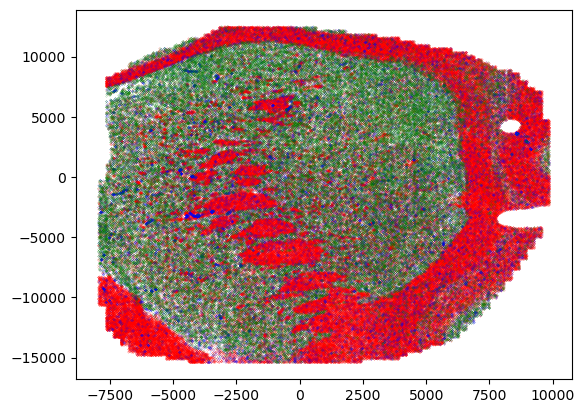

In [21]:
import matplotlib.pyplot as plt
keep_olig = mapmycell_input.obs['Class_name'] == 'OPC-Oligo'
keep_Vascular = mapmycell_input.obs['Class_name'] == 'Vascular'
keep_MSN = mapmycell_input.obs['Class_name'] ==  'CN LGE GABA'

plt.scatter(mapmycell_input[keep_olig].obsm['X_spatial'][:,0],mapmycell_input[keep_olig].obsm['X_spatial'][:,1], s = 0.01, c = 'r')
plt.scatter(mapmycell_input[keep_Vascular].obsm['X_spatial'][:,0],mapmycell_input[keep_Vascular].obsm['X_spatial'][:,1], s = 0.01, c = 'b')
plt.scatter(mapmycell_input[keep_MSN].obsm['X_spatial'][:,0],mapmycell_input[keep_MSN].obsm['X_spatial'][:,1], s = 0.01, c = 'g')
plt.show()

- Check the spatial map of the labeled cells

In [22]:
def plot_cluster_scdata(scdata,cmap,all_clusters,clusters=[1,2],bg_color = 'gray',bg_pt_size = 5, point_sz = 25, transpose=1,flipx=1,flipy=1,hue_input = 'leiden' , ax = None,use_seaborn = False,show_title = True):
    """
    plot spatial location of cell cluster using either seaborn or matplotlib
    use seaborn for individual clusters
    use matplotlib scatter function to visualize all clusters
    cmap - dictionary that has color of each cluster  used in umap
    """
    fig = None
    if not ax:
     fig,ax = plt.subplots(figsize=(15, 15),)# facecolor="black")

    
    if use_seaborn:
        x,y,hue = 'x', 'y',hue_input
        sns.scatterplot(x=x, y=y, data=scdata.obs, 
                        s=bg_pt_size, markers=dict(marker_edge_color='none'),
                        rasterized=True,
                        ax=ax,c= bg_color)
    else: # use matplotlib
        x,y = (np.array(scdata.obs[['x', 'y']])*[flipx,flipy])[:,::transpose].T
        ax.scatter(x, y, c=bg_color, s = bg_pt_size, marker='.')
        
    for cluster in clusters:
        clst_idx = all_clusters.index(cluster)
        cluster_ = str(cluster)
        inds = scdata.obs[hue_input] == cluster_
        
        #col = cmap[int(clst_idx) % len(cmap)]
        col = cmap[cluster_] # cmap is dictionary
        
        if use_seaborn:
            sns.scatterplot(x=x, y=y, data=scdata.obs[inds], 
                        s=point_sz, markers=dict(marker_edge_color='none'),
                        rasterized=True,
                        ax=ax,c= col)
            if show_title:
                ax.set_title(f'cluster {cluster_}',fontsize = 7, y= 1)
        else:
            x_ = x[inds]
            y_ = y[inds]
            ax.scatter(x_, y_, c=col, s= point_sz, marker='.',label = cluster_)
        
        
    
    # ax.set_xlim([x.min(),x.max()])
    # ax.set_ylim([y.min(),y.max()])
    ax.grid(False)
    ax.axis("off")
    ax.axis("equal")
    if fig:
        ax.legend( loc = 'lower center', ncol = len(clusters)//3,markerscale = 12, title = 'Clusters',facecolor = 'black',
            labelcolor = 'white')
        ax.set_title(np.unique(scdata.obs['sample'])[0])
    else:
        # ax.legend( loc = 'lower center')
        pass
        
    ax.autoscale(enable=True, tight=True)
    
   

In [23]:
#### rotate the sections by some degree manually
def rotate(spatial_x,deg):
    """
    spatial_X: Nx2 matrix
    deg: rotation degree in radian
    
    """
    deg = np.deg2rad(deg)
    rotation_mat = np.array([[np.cos(deg),-1*np.sin(deg)],
                            [np.sin(deg),np.cos(deg)]])
    return np.matmul(spatial_x,rotation_mat)

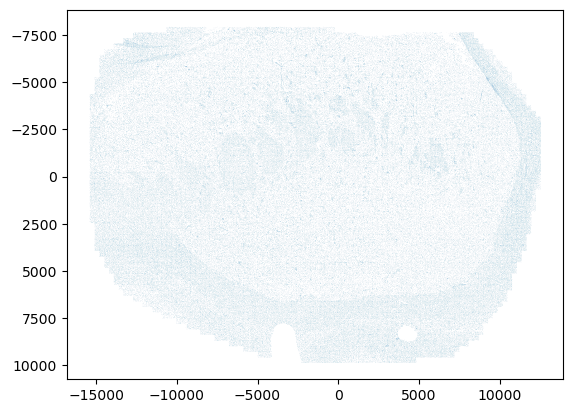

In [24]:
import seaborn as sns
fig,ax  = plt.subplots(1,1,dpi = 100)

sns.scatterplot(x =mapmycell_input.obsm['X_spatial'][:,1],y= mapmycell_input.obsm['X_spatial'][:,0],s  = 0.01,ax = ax)
ax.invert_yaxis()
plt.show()

In [25]:
deg = -0
spatial_rot = rotate(mapmycell_input.obsm['X_spatial'].toarray(),deg)


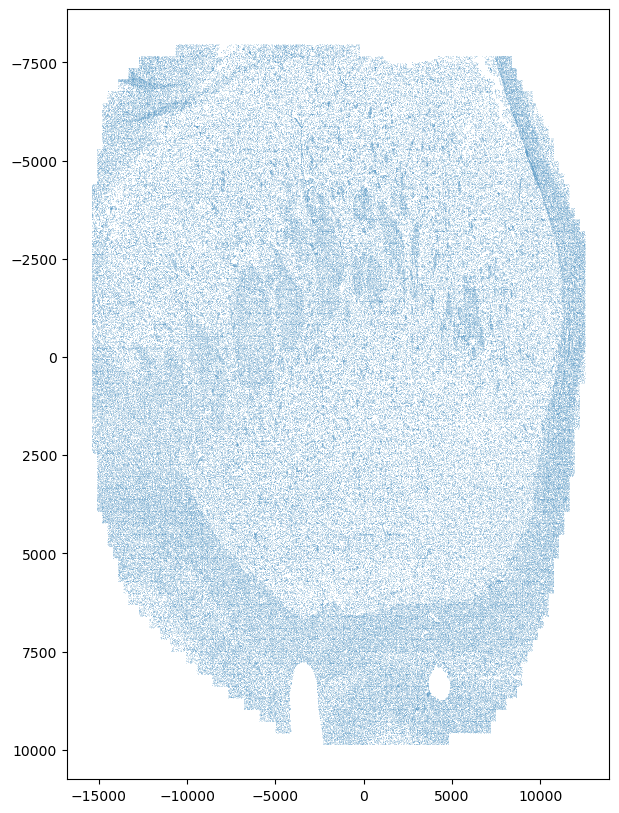

In [26]:
import seaborn as sns
fig,ax  = plt.subplots(1,1,dpi = 100,figsize = (7,10))

sns.scatterplot(x =spatial_rot[:,1],y= spatial_rot[:,0],s  = 0.1,ax = ax)
ax.invert_yaxis()
plt.show()

In [27]:
# update Y and X with the rotated coordinates
mapmycell_input.obs[['y','x']] = spatial_rot.copy()
mapmycell_input.obs

,Class_label,Class_name,Class_bootstrapping_probability,Subclass_label,Subclass_name,Subclass_bootstrapping_probability,Group_label,Group_name,Group_bootstrapping_probability,y,x
Conv_zscan__1864--1,CS20250428_CLASS_0008,Immune,0.56,CS20250428_SUBCL_0019,Microglia,0.38,CS20250428_GROUP_0019,Microglia,1.00,7779.716869,1249.472713
Conv_zscan__1864--2,CS20250428_CLASS_0010,OPC-Oligo,0.41,CS20250428_SUBCL_0022,Oligodendrocyte,0.56,CS20250428_GROUP_0018,ImOligo,1.00,7778.161997,1454.411530
Conv_zscan__1864--4,CS20250428_CLASS_0000,Astro-Epen,1.00,CS20250428_SUBCL_0000,Astrocyte,1.00,CS20250428_GROUP_0039,Astrocyte,0.79,7786.445588,1447.685883
Conv_zscan__1864--5,CS20250428_CLASS_0006,F M GABA,0.47,CS20250428_SUBCL_0005,CN LHX8 GABA,0.74,CS20250428_GROUP_0020,GPe-NDB-SI LHX6-LHX8-GBX1 GABA,0.67,7787.308235,1471.726151
Conv_zscan__1864--6,CS20250428_CLASS_0008,Immune,0.55,CS20250428_SUBCL_0019,Microglia,0.74,CS20250428_GROUP_0019,Microglia,1.00,7791.470815,1290.228073
...,...,...,...,...,...,...,...,...,...,...,...
Conv_zscan__4180--159,CS20250428_CLASS_0003,CN LGE GABA,0.99,CS20250428_SUBCL_0028,STR D1 MSN,0.61,CS20250428_GROUP_0049,STRd D1 Matrix MSN,0.60,-293.410522,-13151.137070
Conv_zscan__4180--181,CS20250428_CLASS_0005,CN MGE GABA,0.71,CS20250428_SUBCL_0033,STR SST-CHODL GABA,0.92,CS20250428_GROUP_0043,STR SST-CHODL GABA,1.00,-240.563446,-13288.093918
Conv_zscan__4180--186,CS20250428_CLASS_0010,OPC-Oligo,0.86,CS20250428_SUBCL_0022,Oligodendrocyte,0.99,CS20250428_GROUP_0018,ImOligo,1.00,-498.365128,-13264.331444
Conv_zscan__4180--199,CS20250428_CLASS_0011,Vascular,0.40,CS20250428_SUBCL_0011,Endo,1.00,CS20250428_GROUP_0011,Endo,1.00,-509.555159,-13222.232773


In [28]:
cmap = ["#e6194B", "#3cb44b", "#ffe119", "#4363d8", "#f58231", "#911eb4", "#42d4f4", "#f032e6", "#bfef45",
        "#fabed4", "#469990", "#dcbeff", "#9A6324", "#fffac8", "#800000", "#aaffc3", "#808000", "#ffd8b1",
        "#000075", "#a9a9a9"]

In [29]:
keep =  mapmycell_input.obs['Class_name'] == 'CN LGE GABA'
np.unique(mapmycell_input[keep].obs['Group_name'])

array(['GPe MEIS2-SOX6 GABA', 'OT D1 ICj', 'STR D1D2 Hybrid MSN',
       'STRd D1 Matrix MSN', 'STRd D1 Striosome MSN',
       'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN',
       'STRd D2 Striosome MSN', 'STRv D1 MSN', 'STRv D1 NUDAP MSN',
       'STRv D2 MSN'], dtype=object)

In [30]:
adata

AnnData object with n_obs × n_vars = 507450 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'Ensemble_ID'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'umap'
    obsm: 'X_raw', 'X_spatial', 'X_umap'
    layers: 'X_raw'
    obsp: 'connectivities', 'distances'

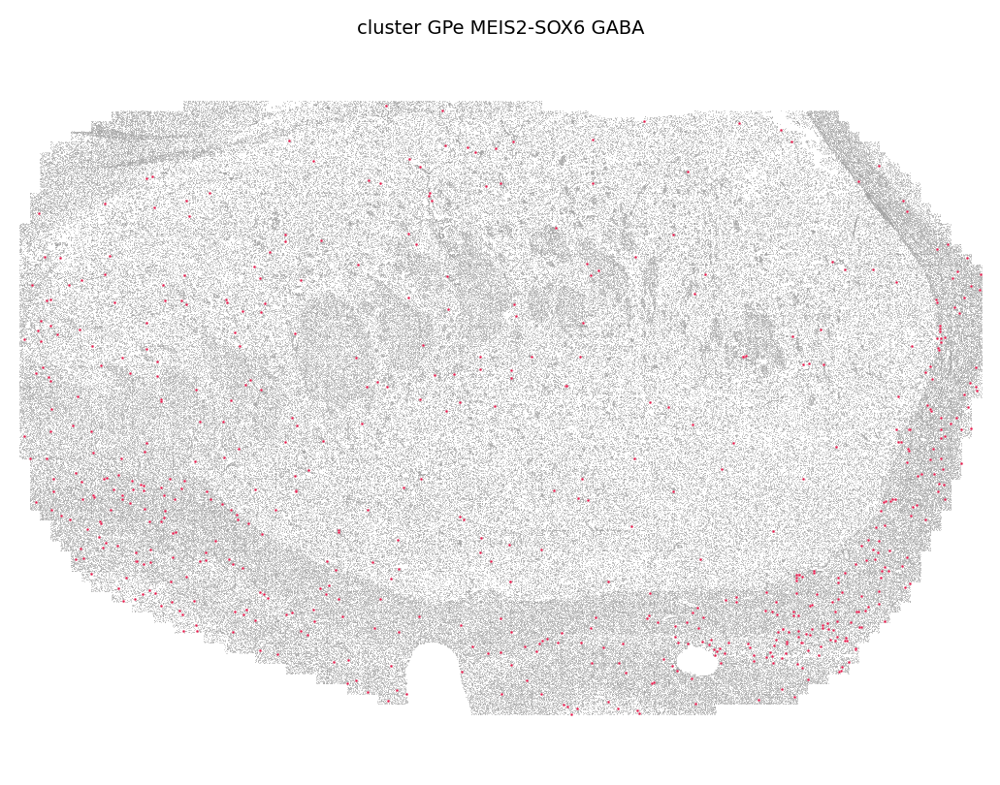

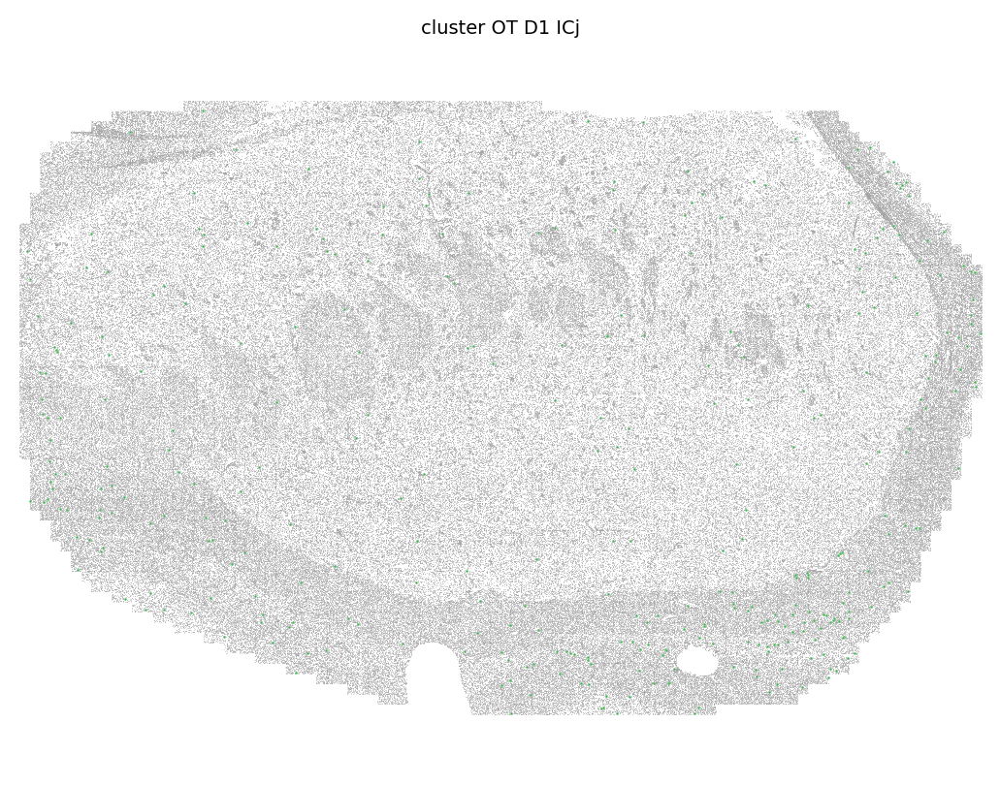

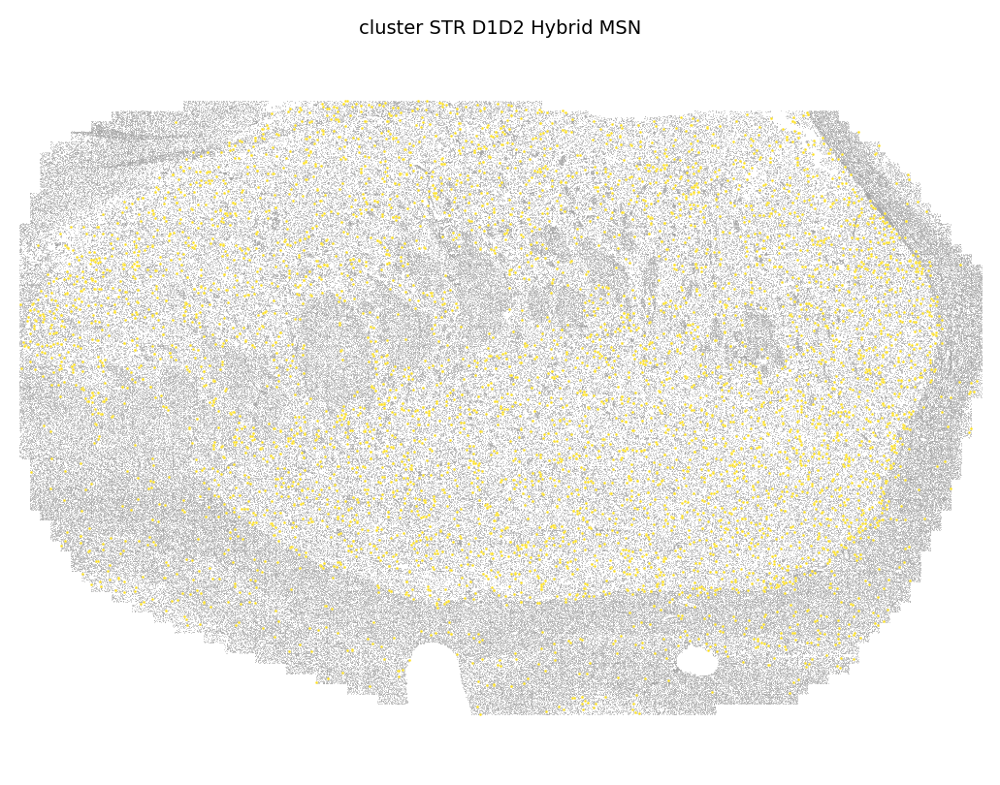

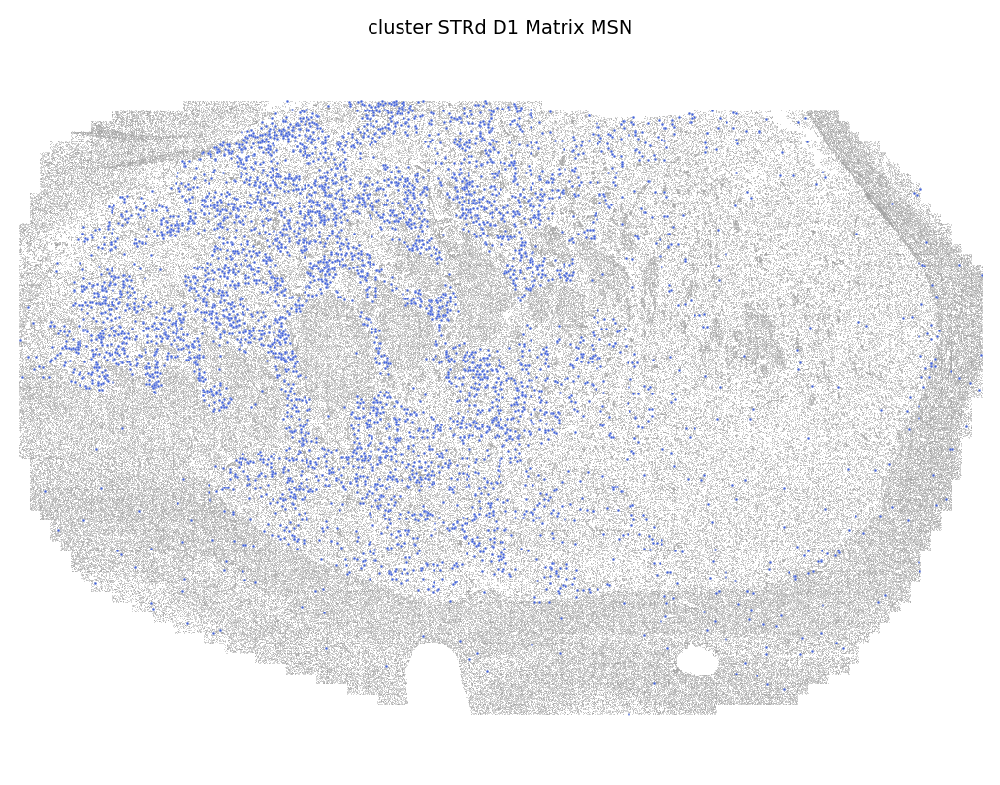

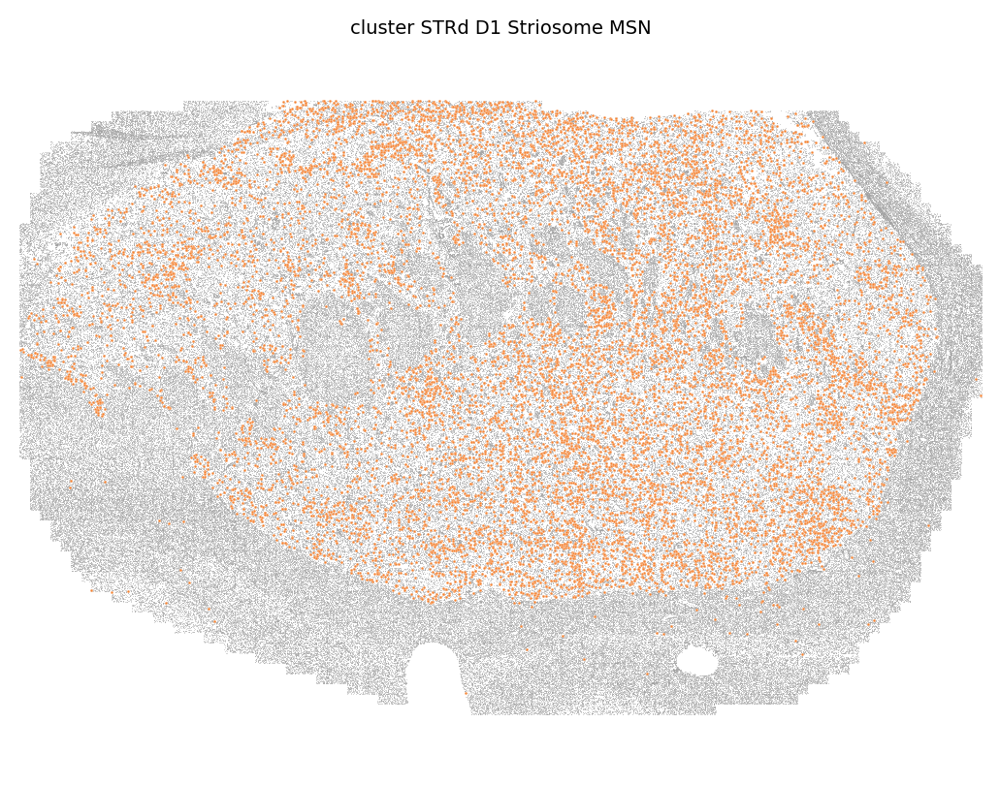

...

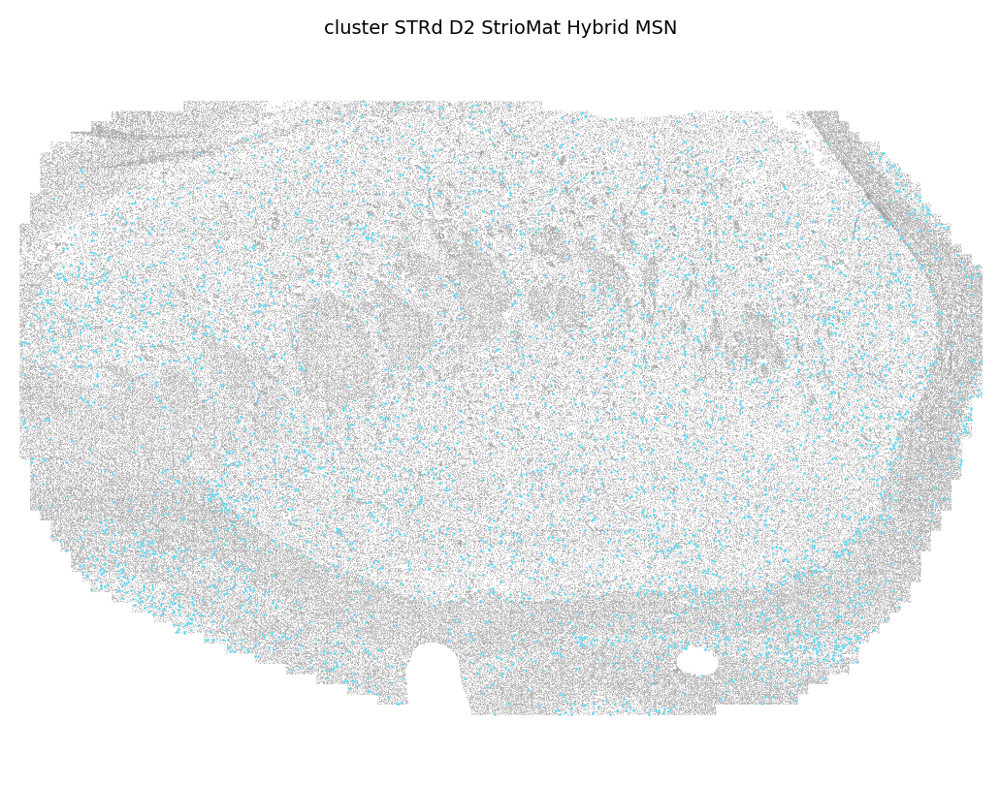

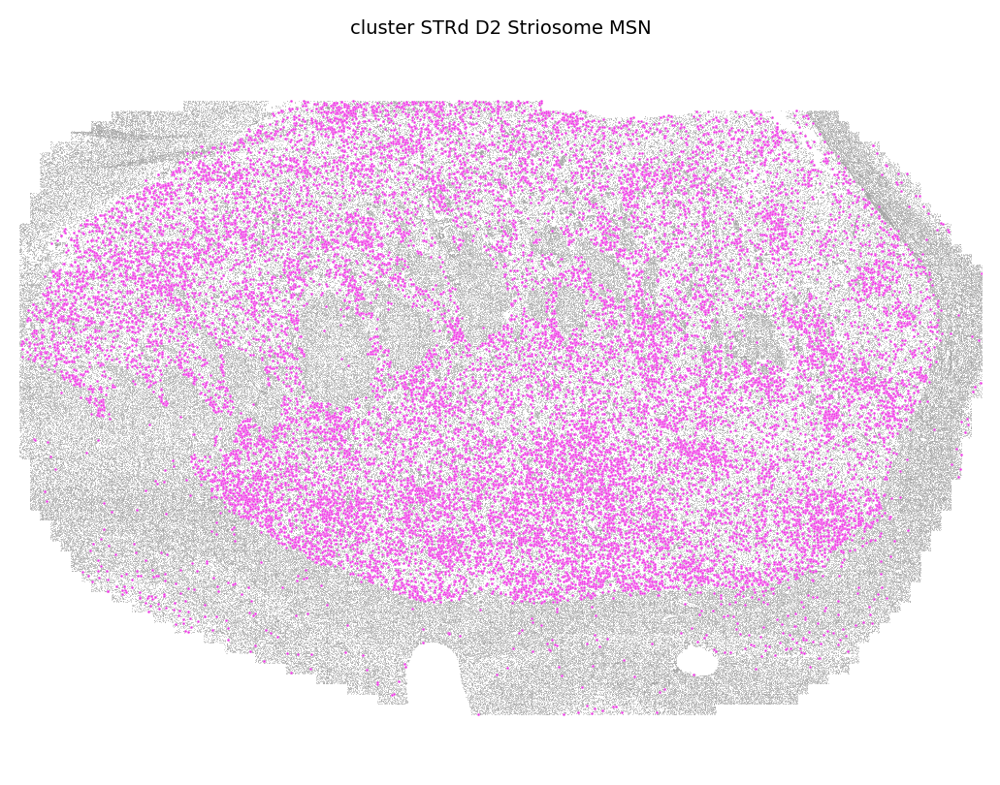

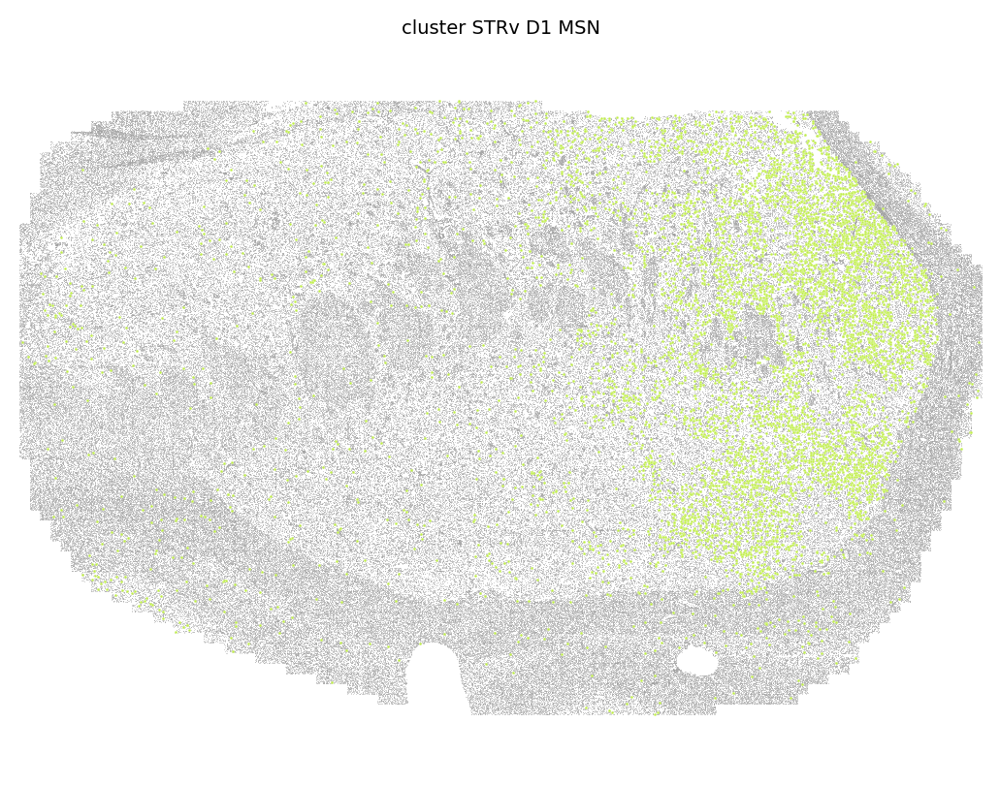

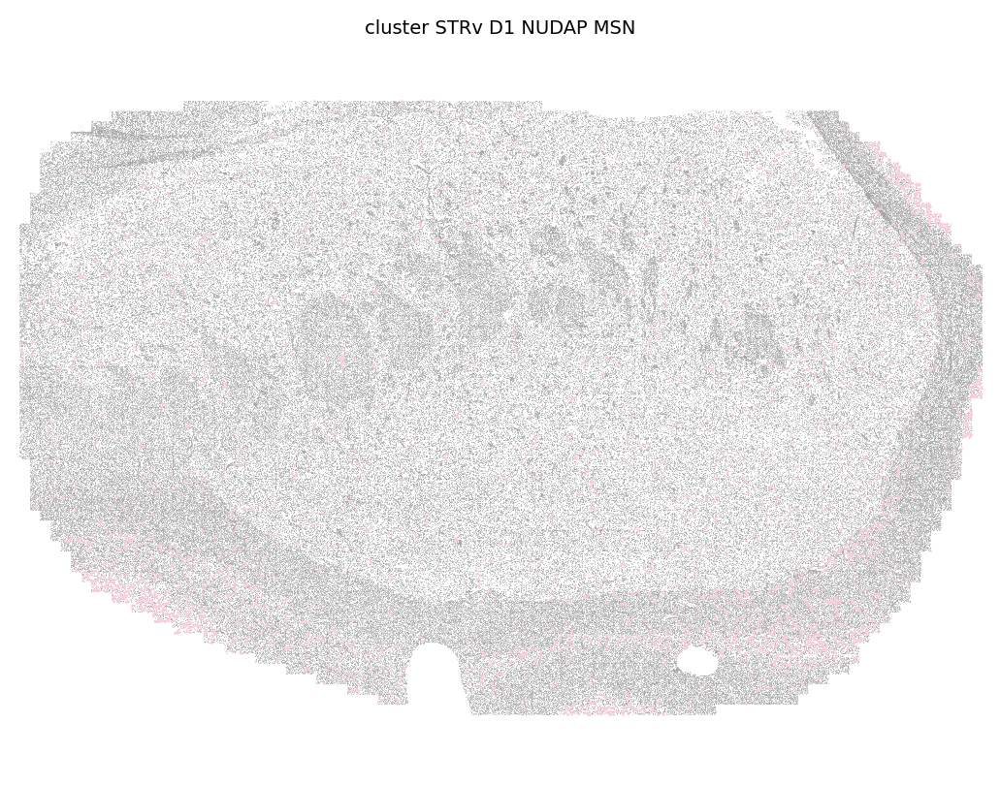

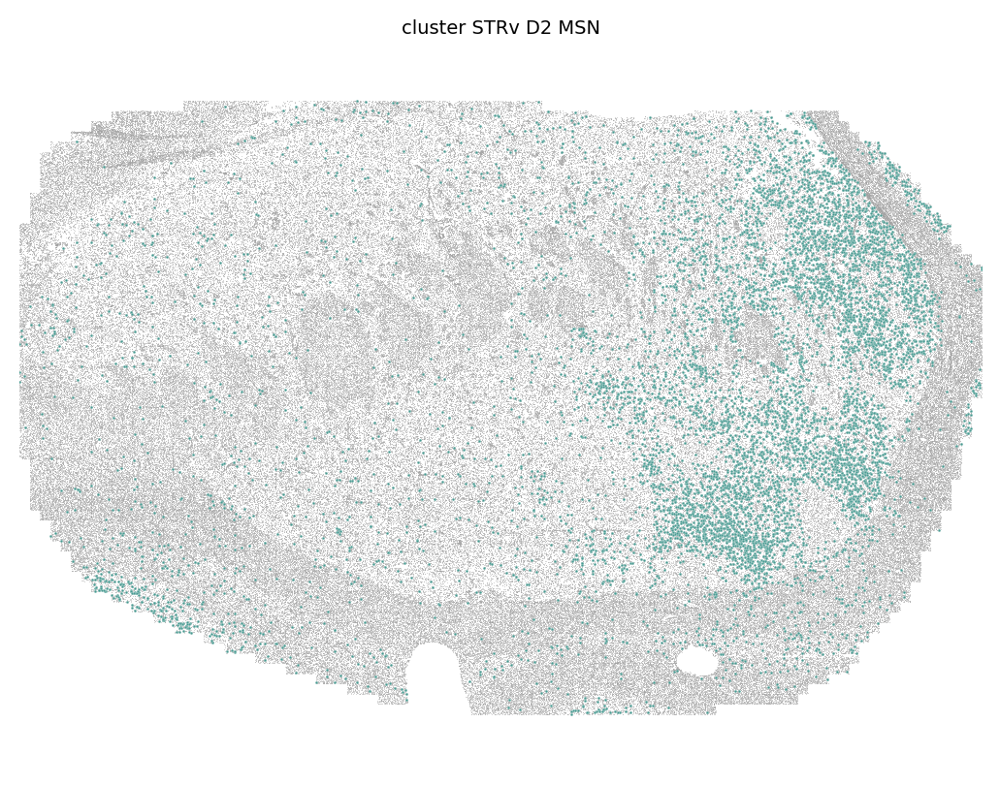

In [31]:
import seaborn as sns
# clusters = list(np.unique(mapmycell_input.obs['Class_name']))
clusters = ['GPe MEIS2-SOX6 GABA', 'OT D1 ICj', 'STR D1D2 Hybrid MSN',
       'STRd D1 Matrix MSN', 'STRd D1 Striosome MSN',
       'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN',
       'STRd D2 Striosome MSN', 'STRv D1 MSN', 'STRv D1 NUDAP MSN',
       'STRv D2 MSN']
cluster_cmap = {c:cmap[i%len(cmap)] for i,c in enumerate(clusters)}


for clst in clusters: #np.unique(mapmycell_input.obs['Class_name']):
    fig,ax = plt.subplots(1,1, dpi = 200)
    plot_cluster_scdata(mapmycell_input,cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.06,point_sz = 1,ax = ax,use_seaborn = True,hue_input = 'Group_name')
    ax.invert_yaxis()
    plt.show()

# fig = plt.figure(dpi = 500)
# nrows = 4
# gs = fig.add_gridspec(nrows = nrows +2,ncols = len(clusters)//nrows,)
# for i,clst in enumerate(clusters):
#     ax = fig.add_subplot(gs[i//gs.ncols,i%gs.ncols])
#     plot_cluster_scdata(mapmycell_input,cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.06,point_sz = 0.1,ax = ax,use_seaborn = True,hue_input = 'Class_name')
# # plt.savefig(DATA_DIR + os.sep + 'figures' + os.sep + sample +'_individual_cluster_insitu.tif' ) 
# plt.show()

### 4. check alignment with UMAP

In [32]:
adata.obs = adata.obs.join(cell_type_annotation)

In [33]:
adata.obs.columns

Index(['volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'leiden', 'Neighborhood_label',
       'Neighborhood_name', 'Neighborhood_bootstrapping_probability',
       'Class_label', 'Class_name', 'Class_bootstrapping_probability',
       'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability',
       'Group_label', 'Group_name', 'Group_bootstrapping_probability',
       'Cluster_label', 'Cluster_name', 'Cluster_alias',
       'Cluster_bootstrapping_probability'],
      dtype='object')

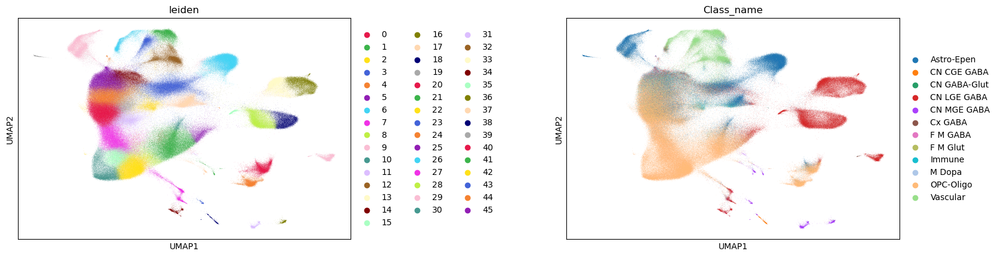

In [34]:
sc.pl.umap(adata, color = ['leiden','Class_name'],wspace = 0.5)

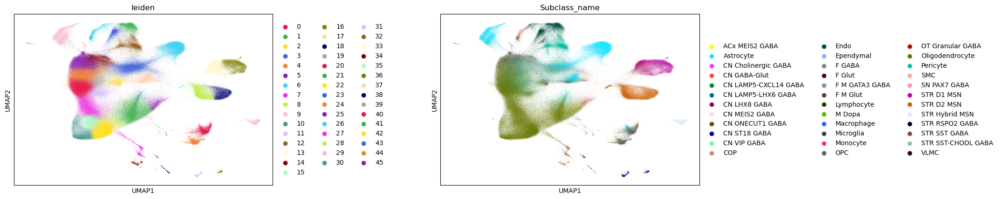

In [35]:
sc.pl.umap(adata, color = ['leiden','Subclass_name'],wspace = 0.5)

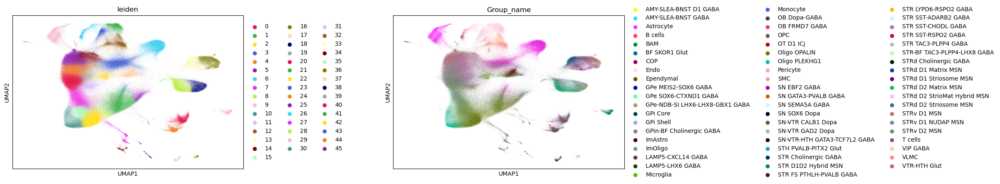

In [36]:
sc.pl.umap(adata, color = ['leiden','Group_name'],wspace = 0.5)

In [37]:
# save the rotated spatial coordinate 
adata.obsm['X_spatial_rotated'] = mapmycell_input.obs[['x','y']].values.copy()

In [38]:
fl_path.replace('.h5ad','_annotated.h5ad')

'./processed_data/MER5_CaPuNAc_3924__MERFISH_Ldclustered_adata_annotated.h5ad'

In [39]:
adata.write_h5ad(fl_path.replace('.h5ad','_mapmycellAnnotated.h5ad'), compression='gzip')

In [40]:
adata

AnnData object with n_obs × n_vars = 507450 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'Ensemble_ID'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'umap', 'Class_name_colors', 'Subclass_name_colors', 'Group_name_colors'
    obsm: 'X_raw', 'X_spatial', 'X_umap', 'X_spatial_rotated'
    la

In [44]:
adata.layers['X_raw'].shape,adata.obsm['X_raw'].shape

((1124161, 673), (1124161, 769))